In [1]:
import pickle
from pathlib import Path

feb_path = Path('/Volumes/TOSHIBA EXT/P-Selectin Data/ttc_data_feb.pkl')
july_path = Path('/Volumes/TOSHIBA EXT/P-Selectin Data/ttc_data_july.pkl')

with open(feb_path, 'rb') as f:
    feb_df = pickle.load(f)
with open(july_path, 'rb') as f:
    july_df = pickle.load(f)

In [2]:
feb_df.head()

,Mouse Name,Day,Tumor Side,Irradiated,Scan Path,Seg Path,Radiomics Features
0,C1M1,0,L,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,False,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...
1,C1M1,0,R,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,False,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...
2,C2M1,0,L,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,False,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...
3,C2M1,0,R,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,False,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...
4,C2M2,0,L,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,False,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...


In [3]:
# Swap values between Irradiated and Seg Path columns
feb_df[['Irradiated', 'Seg Path']] = feb_df[['Seg Path', 'Irradiated']].values

In [4]:
feb_df.head()

,Mouse Name,Day,Tumor Side,Irradiated,Scan Path,Seg Path,Radiomics Features
0,C1M1,0,L,False,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...
1,C1M1,0,R,False,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...
2,C2M1,0,L,False,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...
3,C2M1,0,R,False,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...
4,C2M2,0,L,False,/media/das/TOSHIBA EXT/P-Selectin Data/VOIs/20...,/media/das/TOSHIBA EXT/P-Selectin Data/Feb 201...,[{'diagnostics_Versions_PyRadiomics': 'v3.0.1'...


In [5]:
import numpy as np
import matplotlib.pyplot as plt

def smooth_curve(data, window_size=5):
    """
    Smooth a curve using a moving average filter to remove noise
    
    Args:
        data: List or array of values to smooth
        window_size: Size of moving average window (default 5)
    Returns:
        Smoothed data array
    """
    kernel = np.ones(window_size) / window_size
    return np.convolve(data, kernel, mode='valid')

def remove_outliers(data, threshold=2, window_size=10):
    """
    Remove outliers from data using z-score method with sliding window
    
    Args:
        data: List or array of values to process
        threshold: Z-score threshold for outlier detection (default 2)
        window_size: Size of sliding window for local statistics (default 20)
    Returns:
        Data array with outliers replaced by local mean
    """
    data = np.array(data)
    cleaned_data = data.copy()
    
    # Use sliding window to detect and replace outliers
    for i in range(len(data)):
        # Calculate window boundaries
        window_start = max(0, i - window_size//2)
        window_end = min(len(data), i + window_size//2)
        
        # Get window excluding current point
        window = np.concatenate([data[window_start:i], data[i+1:window_end]])
        
        # Calculate z-score using local window statistics
        z_score = abs((data[i] - np.mean(window)) / np.std(window))
        
        # Replace outliers with local mean
        if z_score > threshold:
            cleaned_data[i] = np.mean(window)
            
    return cleaned_data

def find_steepest_ascent_end(data, window_size=5):
    # Calculate rolling gradients
    gradients = []
    for i in range(len(data)-window_size):
        gradient = (data[i+window_size] - data[i])/window_size
        gradients.append(gradient)
    
    # Find where gradient starts decreasing significantly
    peak_gradient_idx = np.argmax(gradients)
    threshold = np.max(gradients) * 0.05  # 50% of max gradient
    
    for i in range(peak_gradient_idx, len(gradients)):
        if gradients[i] < threshold:
            return i
            
    return peak_gradient_idx + window_size

In [6]:
features = list(feb_df.iloc[0]['Radiomics Features'][0].keys())
mice = feb_df['Mouse Name'].unique()

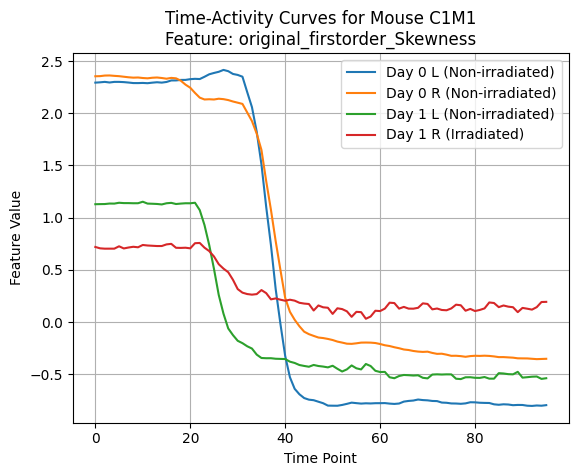

In [7]:
mouse_ix = 0
feature_ix = 50

startIx = 0; endIx = 100
# Get rows for selected mouse on day 0 and 1
mouse_name = mice[mouse_ix]
mouse_rows = feb_df[feb_df['Mouse Name'] == mouse_name]

# Plot TTCs for both days and sides
plt.figure()

for day in [0,1]:
    for side in ['L', 'R']:
        row = mouse_rows[(mouse_rows['Day'] == day) & (mouse_rows['Tumor Side'] == side)]
        if len(row) == 0:
            continue
            
        row_ix = row.index[0]
        radiomics_vals = row['Radiomics Features'].iloc[0]
        
        # Get feature values and smooth
        ttc = [radiomics_vals[i][features[feature_ix]] for i in range(len(radiomics_vals))][startIx:endIx]
        smoothed_ttc = smooth_curve(ttc)
        
        # Create label with irradiation status
        irr_status = 'Irradiated' if row['Irradiated'].iloc[0] else 'Non-irradiated'
        label = f'Day {day} {side} ({irr_status})'
        
        plt.plot(smoothed_ttc, label=label)

plt.title(f'Time-Activity Curves for Mouse {mouse_name}\nFeature: {features[feature_ix]}')
plt.xlabel('Time Point') 
plt.ylabel('Feature Value')
plt.legend()
plt.grid(True)



/var/folders/5z/myjw1nc12n3g808z31wz0kt80000gn/T/ipykernel_14410/1768162331.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


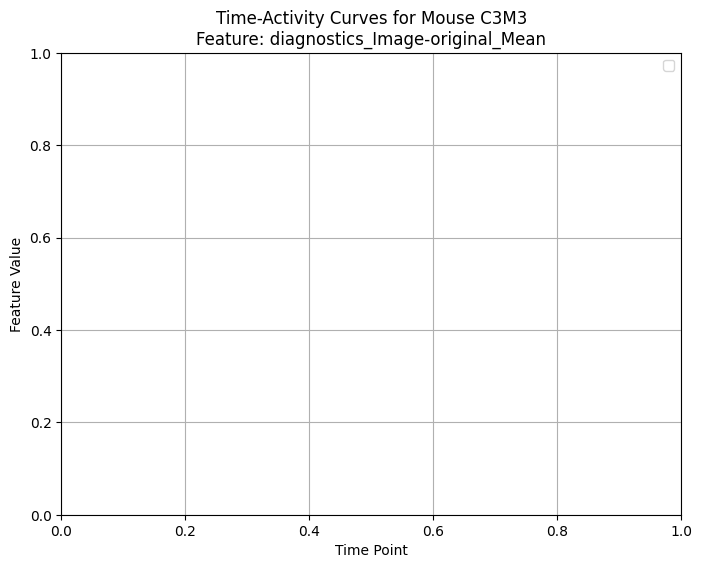

In [8]:
mouse_ix = 8
feature_ix = 11

startIx = 0; endIx = 100
# Get rows for selected mouse on day 0 and 1
mouse_name = mice[mouse_ix]
mouse_rows = july_df[july_df['Mouse Name'] == mouse_name]

# Plot TTCs for both days and sides
# Create figure and store peak indices
plt.figure(figsize=(8, 6))
peak_indices = []

for day in [0,1]:
    for side in ['L', 'R']:
        row = mouse_rows[(mouse_rows['Day'] == day) & (mouse_rows['Tumor Side'] == side)]
        if len(row) == 0:
            continue
            
        row_ix = row.index[0]
        radiomics_vals = row['Radiomics Features'].iloc[0]
        
        # Get feature values for feature 11
        ttc = [radiomics_vals[i][features[11]] for i in range(len(radiomics_vals))][startIx:endIx]
        peak_idx = find_steepest_ascent_end(ttc)
        
        row = mouse_rows[(mouse_rows['Day'] == day) & (mouse_rows['Tumor Side'] == side)]
        if len(row) == 0:
            continue
            
        row_ix = row.index[0]
        radiomics_vals = row['Radiomics Features'].iloc[0]
        
        # Get feature values and smooth
        ttc = [radiomics_vals[i][features[feature_ix]] for i in range(len(radiomics_vals))][startIx:endIx]
        smoothed_ttc = smooth_curve(ttc)
        
        # Create label with irradiation status
        irr_status = 'Irradiated' if row['Irradiated'].iloc[0] else 'Non-irradiated'
        label = f'Day {day} {side} ({irr_status})'
        
        plt.plot(smoothed_ttc, label=label)
        colors = ['red', 'blue', 'green', 'orange']  # Define colors for each iteration
        color_idx = (day * 2 + (0 if side == 'L' else 1)) % len(colors)  # Calculate color index based on day and side
        plt.axvline(x=peak_idx, linestyle='--', alpha=0.5, color=colors[color_idx],
                   label=f'Peak Day {day} {side}')
        
plt.title(f'Time-Activity Curves for Mouse {mouse_name}\nFeature: {features[feature_ix]}')
plt.xlabel('Time Point') 
plt.ylabel('Feature Value')
plt.legend()
plt.grid(True)



In [9]:
import pandas as pd

startIx = 0; endIx = 100

df_entries = []

# Calculate washout rate for each curve
for idx, row in feb_df.iterrows():  
    
    for featureIx in range(11, len(features)):
        radiomics_vals = row['Radiomics Features']
        
        # Get feature values for feature 11
        ttc = []
        for i in range(len(radiomics_vals)):
            try:
                ttc.append(radiomics_vals[i][features[featureIx]])
            except KeyError:
                ttc.append(ttc[-1])
            ttc = ttc[startIx:endIx]
        
        # Remove outliers
        try:    
            smoothed_ttc = smooth_curve(ttc)
        except ValueError:
            # print("Skipping", features[featureIx])
            continue
        
        if featureIx == 11:
            peak_idx = find_steepest_ascent_end(ttc)
            
        # Calculate statistics for the full curve
        total_min = np.min(smoothed_ttc)
        total_max = np.max(smoothed_ttc)
        total_mean = np.mean(smoothed_ttc)
        total_median = np.median(smoothed_ttc)
        total_std = np.std(smoothed_ttc)
        
        # Calculate statistics for washin period (before peak)
        washin_ttc = smoothed_ttc[:peak_idx+1]
        washin_min = np.min(washin_ttc)
        washin_max = np.max(washin_ttc)
        washin_mean = np.mean(washin_ttc)
        washin_median = np.median(washin_ttc)
        washin_std = np.std(washin_ttc)
        
        # Calculate washin rate using linear regression
        washin_time_points = np.arange(len(washin_ttc))
        washin_slope, _ = np.polyfit(washin_time_points, washin_ttc, 1)
        
        # Calculate statistics for washout period (after peak)
        washout_ttc = smoothed_ttc[peak_idx:]
        washout_min = np.min(washout_ttc)
        washout_max = np.max(washout_ttc)
        washout_mean = np.mean(washout_ttc)
        washout_median = np.median(washout_ttc)
        washout_std = np.std(washout_ttc)
        
        # Calculate washout rate using linear regression
        washout_time_points = np.arange(len(washout_ttc))
        washout_slope, _ = np.polyfit(washout_time_points, washout_ttc, 1)
        
        df_entries.append((
            row['Mouse Name'],
            row['Day'],
            features[featureIx],
            row['Tumor Side'],
            row['Irradiated'],
            total_max,
            total_min,
            total_mean,
            total_median,
            total_std,
            washin_max,
            washin_min,
            washin_mean,
            washin_median,
            washin_std,
            washin_slope,
            washout_max,
            washout_min,
            washout_mean,
            washout_median,
            washout_std,
            washout_slope
        ))

feb_stats_df = pd.DataFrame(df_entries, columns=['mouse', 'day', 'feature', 'tumor side', 'irradiated',
                                        'total_max', 'total_min', 'total_mean', 'total_median', 'total_std',
                                        'washin_max', 'washin_min', 'washin_mean', 'washin_median', 'washin_std', 'washin_rate',
                                        'washout_max', 'washout_min', 'washout_mean', 'washout_median', 'washout_std', 'washout_rate'])
feb_stats_df.tail()

,mouse,day,feature,tumor side,irradiated,total_max,total_min,total_mean,total_median,total_std,...,washin_mean,washin_median,washin_std,washin_rate,washout_max,washout_min,washout_mean,washout_median,washout_std,washout_rate
4475,C3M4,0,original_ngtdm_Busyness,R,False,512.567525,7.263400,138.503186,140.292247,99.217305,...,106.066975,14.995304,157.427646,11.899193,265.599331,131.589218,158.025841,143.020653,30.541053,-1.445359
4476,C3M4,0,original_ngtdm_Coarseness,R,False,0.091599,0.002323,0.017704,0.003152,0.024532,...,0.044475,0.043468,0.024279,-0.000072,0.003272,0.002457,0.003015,0.003106,0.000214,0.000011
4477,C3M4,0,original_ngtdm_Complexity,R,False,0.234781,0.007760,0.139276,0.173185,0.075181,...,0.062745,0.016024,0.081123,0.006294,0.222057,0.166655,0.181892,0.175530,0.013890,-0.000686
4478,C3M4,0,original_ngtdm_Contrast,R,False,0.058055,0.000053,0.029779,0.036433,0.018492,...,0.012296,0.000215,0.021231,0.001649,0.054163,0.034488,0.039601,0.037060,0.005080,-0.000254
4479,C3M4,0,original_ngtdm_Strength,R,False,0.089902,0.002324,0.017415,0.003072,0.024118,...,0.043786,0.043287,0.023780,-0.000087,0.003183,0.002433,0.002945,0.003027,0.000197,0.000010


In [10]:
nan_check = feb_stats_df.isna().sum()
assert max(nan_check) == 0, "NaN values found in dataframe"


In [11]:
# Create a new dataframe to store differences between days
feb_diff_df = pd.DataFrame(columns=['mouse', 'feature', 'tumor side', 'irradiated',
                                  'total_max_diff', 'total_min_diff', 'total_mean_diff', 'total_median_diff', 'total_std_diff',
                                  'washin_max_diff', 'washin_min_diff', 'washin_mean_diff', 'washin_median_diff', 'washin_std_diff', 'washin_rate_diff',
                                  'washout_max_diff', 'washout_min_diff', 'washout_mean_diff', 'washout_median_diff', 'washout_std_diff', 'washout_rate_diff'])

# Get unique mice
mice = feb_stats_df['mouse'].unique()

# For each mouse, calculate differences between days
for mouse in mice:
    mouse_data = feb_stats_df[feb_stats_df['mouse'] == mouse]
    
    # Get unique features for this mouse
    features = mouse_data['feature'].unique()
    # Process left and right tumors separately
    for side in ['L', 'R']:
        # Filter data for current mouse and side
        mouse_side_data = mouse_data[mouse_data['tumor side'] == side]
        if len(mouse_side_data) == 0:
            continue
        
        for feature in features:
            feature_data = mouse_side_data[mouse_side_data['feature'] == feature]
            
            # Sort by day to ensure consistent subtraction
            feature_data = feature_data.sort_values('day')
            
            if feature_data['day'].iloc[-1] > feature_data['day'].iloc[0]:
                irradiated = feature_data['irradiated'].iloc[-1]
                total_max_diff = feature_data['total_max'].iloc[-1] - feature_data['total_max'].iloc[0]
                total_min_diff = feature_data['total_min'].iloc[-1] - feature_data['total_min'].iloc[0]
                total_mean_diff = feature_data['total_mean'].iloc[-1] - feature_data['total_mean'].iloc[0]
                total_median_diff = feature_data['total_median'].iloc[-1] - feature_data['total_median'].iloc[0]
                total_std_diff = feature_data['total_std'].iloc[-1] - feature_data['total_std'].iloc[0]
                
                washin_max_diff = feature_data['washin_max'].iloc[-1] - feature_data['washin_max'].iloc[0]
                washin_min_diff = feature_data['washin_min'].iloc[-1] - feature_data['washin_min'].iloc[0]
                washin_mean_diff = feature_data['washin_mean'].iloc[-1] - feature_data['washin_mean'].iloc[0]
                washin_median_diff = feature_data['washin_median'].iloc[-1] - feature_data['washin_median'].iloc[0]
                washin_std_diff = feature_data['washin_std'].iloc[-1] - feature_data['washin_std'].iloc[0]
                washin_rate_diff = feature_data['washin_rate'].iloc[-1] - feature_data['washin_rate'].iloc[0]
                
                washout_max_diff = feature_data['washout_max'].iloc[-1] - feature_data['washout_max'].iloc[0]
                washout_min_diff = feature_data['washout_min'].iloc[-1] - feature_data['washout_min'].iloc[0]
                washout_mean_diff = feature_data['washout_mean'].iloc[-1] - feature_data['washout_mean'].iloc[0]
                washout_median_diff = feature_data['washout_median'].iloc[-1] - feature_data['washout_median'].iloc[0]
                washout_std_diff = feature_data['washout_std'].iloc[-1] - feature_data['washout_std'].iloc[0]
                washout_rate_diff = feature_data['washout_rate'].iloc[-1] - feature_data['washout_rate'].iloc[0]
                
            elif feature_data['day'].iloc[-1] < feature_data['day'].iloc[0]:
                irradiated = feature_data['irradiated'].iloc[0]
                total_max_diff = feature_data['total_max'].iloc[0] - feature_data['total_max'].iloc[-1]
                total_min_diff = feature_data['total_min'].iloc[0] - feature_data['total_min'].iloc[-1]
                total_mean_diff = feature_data['total_mean'].iloc[0] - feature_data['total_mean'].iloc[-1]
                total_median_diff = feature_data['total_median'].iloc[0] - feature_data['total_median'].iloc[-1]
                total_std_diff = feature_data['total_std'].iloc[0] - feature_data['total_std'].iloc[-1]
                
                washin_max_diff = feature_data['washin_max'].iloc[0] - feature_data['washin_max'].iloc[-1]
                washin_min_diff = feature_data['washin_min'].iloc[0] - feature_data['washin_min'].iloc[-1]
                washin_mean_diff = feature_data['washin_mean'].iloc[0] - feature_data['washin_mean'].iloc[-1]
                washin_median_diff = feature_data['washin_median'].iloc[0] - feature_data['washin_median'].iloc[-1]
                washin_std_diff = feature_data['washin_std'].iloc[0] - feature_data['washin_std'].iloc[-1]
                washin_rate_diff = feature_data['washin_rate'].iloc[0] - feature_data['washin_rate'].iloc[-1]
                
                washout_max_diff = feature_data['washout_max'].iloc[0] - feature_data['washout_max'].iloc[-1]
                washout_min_diff = feature_data['washout_min'].iloc[0] - feature_data['washout_min'].iloc[-1]
                washout_mean_diff = feature_data['washout_mean'].iloc[0] - feature_data['washout_mean'].iloc[-1]
                washout_median_diff = feature_data['washout_median'].iloc[0] - feature_data['washout_median'].iloc[-1]
                washout_std_diff = feature_data['washout_std'].iloc[0] - feature_data['washout_std'].iloc[-1]
                washout_rate_diff = feature_data['washout_rate'].iloc[0] - feature_data['washout_rate'].iloc[-1]
                
            else:
                raise ValueError("Day order is not consistent")
                
                
            
            if len(feature_data) > 1:  # Only calculate diff if we have multiple days
                # Calculate differences between consecutive days
                diff_row = {
                    'mouse': mouse,
                    'feature': feature,
                    'tumor side': side,
                    'irradiated': irradiated,
                    'total_max_diff': total_max_diff,
                    'total_min_diff': total_min_diff,
                    'total_mean_diff': total_mean_diff,
                    'total_median_diff': total_median_diff,
                    'total_std_diff': total_std_diff,
                    'washin_max_diff': washin_max_diff,
                    'washin_min_diff': washin_min_diff,
                    'washin_mean_diff': washin_mean_diff,
                    'washin_median_diff': washin_median_diff,
                    'washin_std_diff': washin_std_diff,
                    'washin_rate_diff': washin_rate_diff,
                    'washout_max_diff': washout_max_diff,
                    'washout_min_diff': washout_min_diff,
                    'washout_mean_diff': washout_mean_diff,
                    'washout_median_diff': washout_median_diff,
                    'washout_std_diff': washout_std_diff,
                    'washout_rate_diff': washout_rate_diff,
                }
                
                feb_diff_df = pd.concat([feb_diff_df, pd.DataFrame([diff_row])], ignore_index=True)

feb_diff_df.tail()


/var/folders/5z/myjw1nc12n3g808z31wz0kt80000gn/T/ipykernel_14410/514873994.py:104: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  feb_diff_df = pd.concat([feb_diff_df, pd.DataFrame([diff_row])], ignore_index=True)


,mouse,feature,tumor side,irradiated,total_max_diff,total_min_diff,total_mean_diff,total_median_diff,total_std_diff,washin_max_diff,...,washin_mean_diff,washin_median_diff,washin_std_diff,washin_rate_diff,washout_max_diff,washout_min_diff,washout_mean_diff,washout_median_diff,washout_std_diff,washout_rate_diff
2235,C3M4,original_ngtdm_Busyness,R,True,3904.212389,66.025146,633.494335,621.659860,856.853461,3904.212389,...,421.333150,63.725061,1019.638774,33.640853,3133.344082,601.761066,954.994135,729.273528,532.428608,-30.635496
2236,C3M4,original_ngtdm_Coarseness,R,True,-0.082962,-0.000633,-0.013059,-0.001151,-0.021406,-0.082962,...,-0.037352,-0.035320,-0.022124,-0.000026,-0.001444,-0.000766,-0.001294,-0.001393,-0.000183,-0.000012
2237,C3M4,original_ngtdm_Complexity,R,True,0.003028,0.038806,0.007245,0.029083,0.013862,-0.014704,...,0.009711,0.033333,-0.029565,-0.004038,0.015752,0.053422,0.051850,0.059066,-0.009840,0.000861
2238,C3M4,original_ngtdm_Contrast,R,True,0.000470,0.002994,0.001395,0.006274,0.007466,-0.007429,...,-0.003161,0.003143,-0.007756,-0.001077,0.004363,0.016138,0.017472,0.020862,-0.003077,0.000367
2239,C3M4,original_ngtdm_Strength,R,True,-0.081333,-0.000628,-0.012781,-0.001057,-0.021014,-0.081333,...,-0.036690,-0.035155,-0.021645,-0.000011,-0.001344,-0.000737,-0.001219,-0.001308,-0.000164,-0.000011


In [12]:
nan_check = feb_diff_df.isna().sum()
assert max(nan_check) == 0, "NaN values found in dataframe"

# Manual Investigations

/Users/davidspector/miniconda3/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Feature with least overlap: original_glszm_LargeAreaEmphasis
Stat with best overlap: washin_median
Overlap score: 0.476462890006631


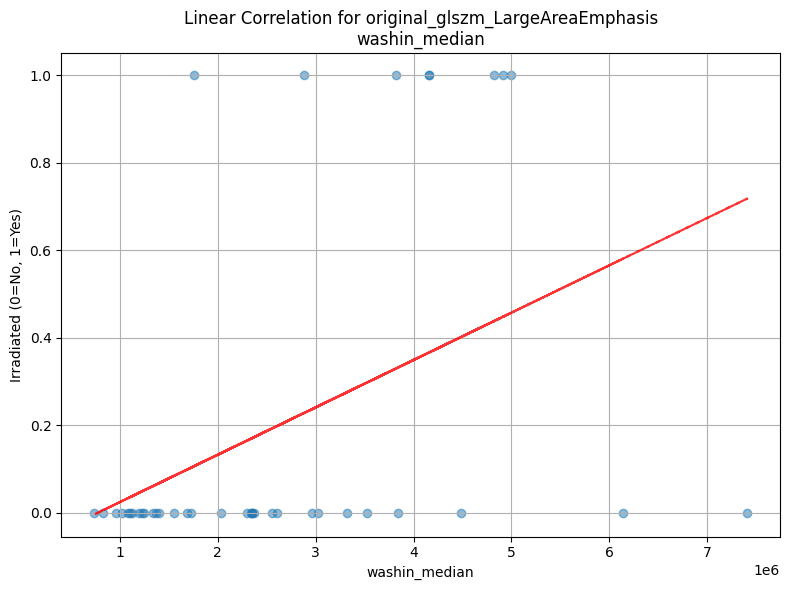

In [13]:
from scipy.stats import spearmanr

# Calculate correlation for each feature
overlap_scores = []

for feature in feb_stats_df['feature'].unique():
    if 'Minimum' in feature:
        continue
    for stat in feb_stats_df.columns:
        if stat in ['mouse', 'day', 'feature', 'tumor side', 'irradiated']:
            continue
        if "min" in stat:
            continue
        
        feature_data = feb_stats_df[feb_stats_df['feature'] == feature]
        y = feature_data['irradiated']
        x = feature_data[stat]
        
        # Calculate Spearman correlation
        correlation, p_value = spearmanr(x, y)
        
        
        overlap_scores.append((feature, stat, abs(correlation)))

# Find feature with minimum overlap
best_feature = max(overlap_scores, key=lambda x: x[2])
print(f"Feature with least overlap: {best_feature[0]}")
print(f"Stat with best overlap: {best_feature[1]}")
print(f"Overlap score: {best_feature[2]}")

# Plot linear correlation for best feature/stat combination
feature_data = feb_stats_df[feb_stats_df['feature'] == best_feature[0]]
x = feature_data[best_feature[1]]
y = feature_data['irradiated'].astype(int)

# Create scatter plot
plt.figure(figsize=(8,6))
plt.scatter(x, y, alpha=0.5)
plt.xlabel(best_feature[1])
plt.ylabel('Irradiated (0=No, 1=Yes)')
plt.title(f'Linear Correlation for {best_feature[0]}\n{best_feature[1]}')

# Add trend line
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x, p(x), "r--", alpha=0.8)

plt.grid(True)
plt.tight_layout()


Feature with least overlap: original_gldm_LargeDependenceHighGrayLevelEmphasis
Stat with best overlap: washout_std
Overlap score: 16


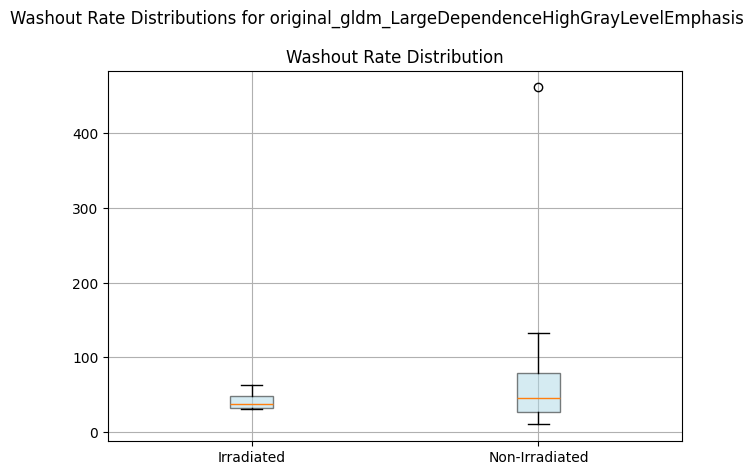

In [14]:
# Calculate range overlap for each feature
overlap_scores = []

for feature in feb_stats_df['feature'].unique():
    if 'Minimum' in feature:
        continue
    for stat in feb_stats_df.columns:
        if stat in ['mouse', 'day', 'feature', 'tumor side', 'irradiated']:
            continue
        if "min" in stat:
            continue
        
        feature_data = feb_stats_df[feb_stats_df['feature'] == feature]
        irradiated = feature_data[feature_data['irradiated'] == True]
        non_irradiated = feature_data[feature_data['irradiated'] == False]
        
        # Calculate number of overlapping points
        rad_points = irradiated[stat].values
        nonrad_points = non_irradiated[stat].values
        
        # Find IQR ranges
        # rad_q1, rad_q3 = np.percentile(rad_points, [25, 75])
        # nonrad_q1, nonrad_q3 = np.percentile(nonrad_points, [25, 75])
        rad_q1, rad_q3 = min(rad_points), max(rad_points)
        nonrad_q1, nonrad_q3 = min(nonrad_points), max(nonrad_points)
        
        # Count points in overlapping range
        overlap_range = (max(rad_q1, nonrad_q1), 
                        min(rad_q3, nonrad_q3))
        overlap_count = (
            np.sum((rad_points >= overlap_range[0]) & 
                (rad_points <= overlap_range[1])) +
            np.sum((nonrad_points >= overlap_range[0]) & 
                (nonrad_points <= overlap_range[1]))
        )
        overlap_scores.append((feature, stat, overlap_count))

# Find feature with minimum overlap
best_feature = min(overlap_scores, key=lambda x: x[2])
print(f"Feature with least overlap: {best_feature[0]}")
print(f"Stat with best overlap: {best_feature[1]}")
print(f"Overlap score: {best_feature[2]}")

# Plot the distributions for the best feature
feature_data = feb_stats_df[feb_stats_df['feature'] == best_feature[0]]
irradiated = feature_data[feature_data['irradiated'] == True]
non_irradiated = feature_data[feature_data['irradiated'] == False]

fig, (ax1) = plt.subplots()

# Box plots for bolus
bp1 = ax1.boxplot([irradiated[best_feature[1]], non_irradiated[best_feature[1]]], 
                  positions=[1, 2], patch_artist=True)
for box in bp1['boxes']:
    box.set(facecolor='lightblue', alpha=0.5)
ax1.set_title('Washout Rate Distribution')
ax1.set_xticks([1, 2])
ax1.set_xticklabels(['Irradiated', 'Non-Irradiated'])

plt.suptitle(f'Washout Rate Distributions for {best_feature[0]}')
plt.grid()
plt.tight_layout()


-1.0745032225320224 0.4051317771989676 -0.6465858174690036 3.33949190587197
Feature with least overlap: diagnostics_Image-original_Mean
Overlap score: 6


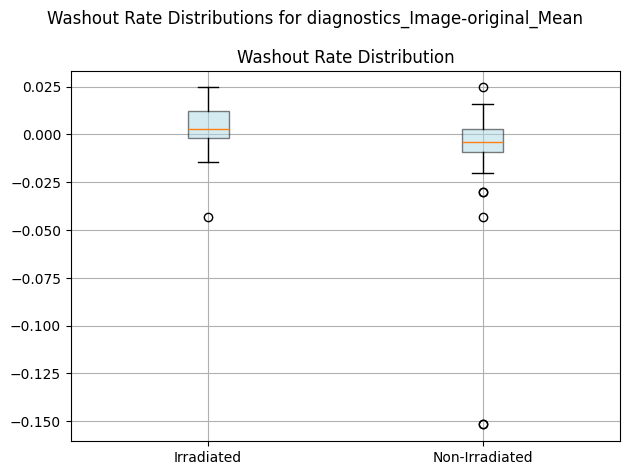

In [15]:
# Calculate range overlap for each feature
overlap_scores = []

for feature in feb_stats_df['feature'].unique():
    if 'Minimum' in feature:
        continue
    feature_data = feb_stats_df[feb_stats_df['feature'] == feature]
    irradiated = feature_data[feature_data['irradiated'] == True]
    non_irradiated = feature_data[feature_data['irradiated'] == False]
    
    # Calculate number of overlapping points
    rad_points = irradiated['washout_rate'].values
    nonrad_points = non_irradiated['washout_rate'].values
    
    # Find IQR ranges
    rad_q1, rad_q3 = np.percentile(rad_points, [25, 75])
    nonrad_q1, nonrad_q3 = np.percentile(nonrad_points, [25, 75])
    
    # Count points in overlapping range
    overlap_range = (max(rad_q1, nonrad_q1), 
                    min(rad_q3, nonrad_q3))
    overlap_count = (
        np.sum((rad_points >= overlap_range[0]) & 
               (rad_points <= overlap_range[1])) +
        np.sum((nonrad_points >= overlap_range[0]) & 
               (nonrad_points <= overlap_range[1]))
    )
    if feature == 'original_firstorder_Variance':
        print(rad_q1, rad_q3, nonrad_q1, nonrad_q3)
    overlap_scores.append((feature, overlap_count))

# Find feature with minimum overlap
best_feature = min(overlap_scores, key=lambda x: x[1])
print(f"Feature with least overlap: {best_feature[0]}")
print(f"Overlap score: {best_feature[1]}")

# Plot the distributions for the best feature
feature_data = feb_stats_df[feb_stats_df['feature'] == best_feature[0]]
irradiated = feature_data[feature_data['irradiated'] == True]
non_irradiated = feature_data[feature_data['irradiated'] == False]

fig, (ax1) = plt.subplots()

# Box plots for bolus
bp1 = ax1.boxplot([irradiated['washout_rate'], non_irradiated['washout_rate']], 
                  positions=[1, 2], patch_artist=True)
for box in bp1['boxes']:
    box.set(facecolor='lightblue', alpha=0.5)
ax1.set_title('Washout Rate Distribution')
ax1.set_xticks([1, 2])
ax1.set_xticklabels(['Irradiated', 'Non-Irradiated'])

plt.suptitle(f'Washout Rate Distributions for {best_feature[0]}')
plt.grid()
plt.tight_layout()


# PCA-SVM, PCA-LDA, PCA-MLP

In [16]:
feb_diff_df.shape

(2240, 21)

In [17]:
# Pivot the diff_df to create a new dataframe where each row is a mouse
# and columns are the features with their respective metrics
feb_mouse_diff_df = feb_diff_df.pivot(index=['mouse', 'irradiated', 'tumor side'], 
                        columns='feature',
                        values=['total_max_diff', 'total_min_diff', 'total_median_diff', 'total_std_diff',
                                'washin_max_diff', 'washin_min_diff', 'washin_median_diff', 'washin_std_diff', 'washin_rate_diff',
                                'washout_max_diff', 'washout_min_diff', 'washout_median_diff', 'washout_std_diff', 'washout_rate_diff'
                            ])

# Flatten the multi-level column names
feb_mouse_diff_df.columns = [f"{col[0]}_{col[1]}" for col in feb_mouse_diff_df.columns]

# Reset index to make mouse, group and responder regular columns
feb_mouse_diff_df = feb_mouse_diff_df.reset_index()

14


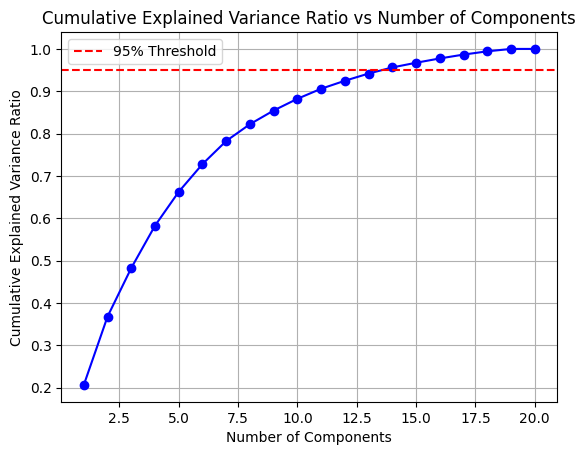

In [18]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Prepare features
X = feb_mouse_diff_df.drop(['mouse', 'tumor side', 'irradiated'], axis=1)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Plot cumulative variance ratio
plt.figure()
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, 'bo-')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Threshold')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs Number of Components')
plt.grid(True)
plt.legend()
n_components_95 = np.argmax(cumulative_variance_ratio >= 0.95) + 1
print(n_components_95)

Cross-validation scores: [1. 0. 1. 0. 1. 1. 1. 0. 1. 0. 1. 0. 1. 1. 1. 0. 1. 0. 1. 0.]
Average CV score: 0.600 (+/- 0.980)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.40      1.00      0.57         8
         1.0       0.00      0.00      0.00        12

    accuracy                           0.40        20
   macro avg       0.20      0.50      0.29        20
weighted avg       0.16      0.40      0.23        20



/Users/davidspector/miniconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/davidspector/miniconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/davidspector/miniconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", le

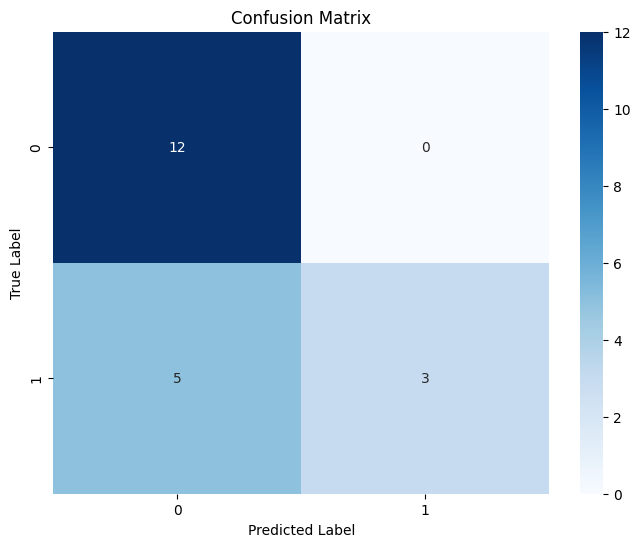

In [19]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, cross_val_score

n_components = 15
# x = X_pca[:,:n_components]
x = X_scaled
y = feb_mouse_diff_df['irradiated']

# Create a pipeline with PCA and SVM
pipeline = Pipeline([
    ('svm', SVC(kernel='rbf', probability=True))
])

# Perform cross-validation
# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv = LeaveOneOut()
cv_scores = cross_val_score(pipeline, x, y, cv=cv)

print("Cross-validation scores:", cv_scores)
print("Average CV score: {:.3f} (+/- {:.3f})".format(cv_scores.mean(), cv_scores.std() * 2))

# Fit the pipeline on the full dataset
pipeline.fit(x, y)

# Get predictions
y_pred = pipeline.predict(x)

# Print classification report
print("\nClassification Report:")
print(classification_report(cv_scores, np.zeros_like(cv_scores)))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


Cross-validation scores: [0.75 0.75 1.   0.75 0.75]
Average CV score: 0.800 (+/- 0.200)

Classification Report:
              precision    recall  f1-score   support

       False       0.83      0.83      0.83        12
        True       0.75      0.75      0.75         8

    accuracy                           0.80        20
   macro avg       0.79      0.79      0.79        20
weighted avg       0.80      0.80      0.80        20



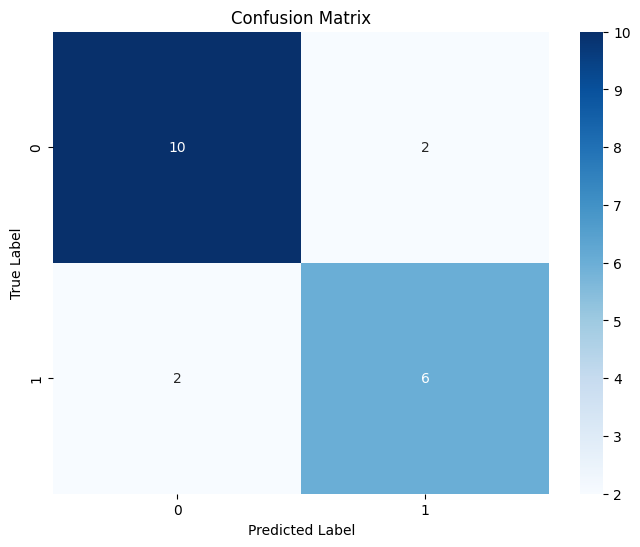

In [225]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import f1_score

n_components = 18

x = X_pca[:,:n_components]
# x = X_scaled
y = feb_mouse_diff_df['irradiated']

# Create a pipeline with PCA and SVM
pipeline = Pipeline([
    ('svm', LinearDiscriminantAnalysis())
])

# Perform cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)
# cv = LeaveOneOut()

cv_scores = cross_val_score(pipeline, x, y, cv=cv)
y_trues = []; y_preds = []
for train, test in cv.split(x):
    pipeline.fit(x[train], y[train])
    y_pred = pipeline.predict(x[test])
    y_trues.extend(y[test])
    y_preds.extend(y_pred)
    
print("Cross-validation scores:", cv_scores)
print("Average CV score: {:.3f} (+/- {:.3f})".format(cv_scores.mean(), cv_scores.std() * 2))

# f1 = f1_score(y_trues, y_preds, average='weighted')
# print("F1 Score:", f1)

print("\nClassification Report:")
print(classification_report(y_trues, y_preds))
# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_trues, y_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

In [97]:
len(feb_mouse_diff_df['mouse'].unique())

10


PyTorch K-Fold Cross Validation Accuracy: 0.900


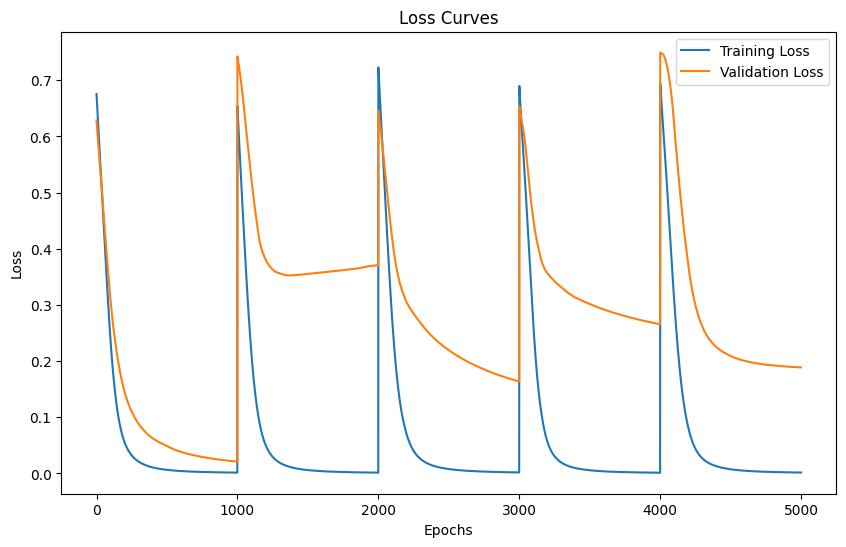

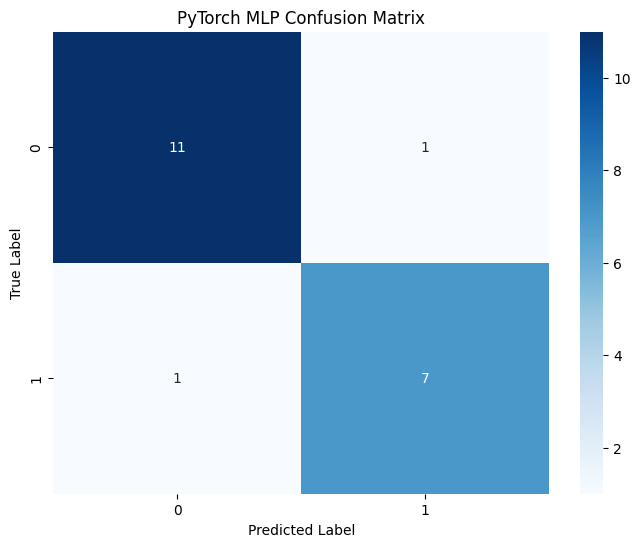


PyTorch Classification Report:
              precision    recall  f1-score   support

         0.0       0.92      0.92      0.92        12
         1.0       0.88      0.88      0.88         8

    accuracy                           0.90        20
   macro avg       0.90      0.90      0.90        20
weighted avg       0.90      0.90      0.90        20



In [220]:
import torch
from sklearn.model_selection import KFold


# Set random seed for reproducibility
torch.manual_seed(71)
torch.cuda.manual_seed(71)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# n_components = 20

y = feb_mouse_diff_df['irradiated']

# Create a simple MLP classifier using PyTorch
class MLP(torch.nn.Module):
    def __init__(self, input_size):
        super(MLP, self).__init__()
        self.layer1 = torch.nn.Linear(input_size, 20)         
        self.layer2 = torch.nn.Linear(20, 1)         
        self.relu = torch.nn.ReLU()         
        self.sigmoid = torch.nn.Sigmoid()      
    
    def forward(self, x):         
        x = self.relu(self.layer1(x))         
        x = self.sigmoid(self.layer2(x))         
        return x 

# Convert data to PyTorch tensors
X_tensor = torch.FloatTensor(x)
y_tensor = torch.FloatTensor(y.values.reshape(-1, 1))

# Perform 5-fold Cross Validation with PyTorch
kf = KFold(n_splits=5, shuffle=True, random_state=71)
torch_kf_scores = []
torch_y_pred_all = []
torch_y_true_all = []
torch_losses = []

# Early stopping parameters
patience = 100
min_delta = 0.001
patience_counter = 0
best_loss = float('inf')
early_stop = False

# Lists to track validation loss
train_losses = []
val_losses = []


for train_idx, test_idx in kf.split(x, y):
    # Split data
    X_train = X_tensor[train_idx]
    X_test = X_tensor[test_idx]
    y_train = y_tensor[train_idx]
    y_test = y_tensor[test_idx]
    
    # Initialize model and optimizer
    model = MLP(input_size=x.shape[1])
    criterion = torch.nn.BCELoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
    # scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=3, verbose=True)
    
    # Train the model
    model.train()
    for epoch in range(1000):
        # Forward pass
        optimizer.zero_grad()
        outputs = model(X_train)
        
        # Calculate validation loss for early stopping
        with torch.no_grad():
            val_outputs = model(X_test)
            val_loss = criterion(val_outputs, y_test)
            val_losses.append(val_loss.item())
            
        # Early stopping check
        if val_loss < best_loss - min_delta:
            best_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            
        # if patience_counter >= patience:
        #     print(f"Early stopping at epoch {epoch}")
        #     break
        
        # Add L2 regularization
        l2_lambda = 0.0
        l2_norm = sum(p.pow(2.0).sum() for p in model.parameters())
        loss = criterion(outputs, y_train) + l2_lambda * l2_norm
        train_losses.append(loss.item())
        
        loss.backward()
        optimizer.step()
    
    # Make prediction
    model.eval()
    with torch.no_grad():
        pred = model(X_test)
        pred_class = (pred > 0.5).float()
        
    torch_kf_scores.append((pred_class == y_test).float().mean().item())
    torch_y_pred_all.extend(list(pred_class.numpy()))
    torch_y_true_all.extend(list(y_test.numpy()))
    # break
# Calculate and print results
torch_loo_accuracy = np.mean(torch_kf_scores)
print(f"\nPyTorch K-Fold Cross Validation Accuracy: {torch_loo_accuracy:.3f}")

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.title('Loss Curves')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

# Create confusion matrix
torch_cm = confusion_matrix(torch_y_true_all, torch_y_pred_all)
plt.figure(figsize=(8, 6))
sns.heatmap(torch_cm, annot=True, fmt='d', cmap='Blues')
plt.title('PyTorch MLP Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

print("\nPyTorch Classification Report:")
print(classification_report(torch_y_true_all, torch_y_pred_all))


In [191]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

# Perform Lasso regression for feature selection
lasso = Lasso(alpha=0.01, random_state=42)  # Adjust alpha as needed
lasso.fit(x, y)

# Select features with non-zero coefficients
model = SelectFromModel(lasso, prefit=True)
x_selected = model.transform(x)

# Get the selected feature names
selected_features = feb_mouse_diff_df.drop(['mouse', 'tumor side', 'irradiated'], axis=1).columns[model.get_support()]
print("Selected Features:", selected_features)

Selected Features: Index(['total_max_diff_original_glcm_Imc1',
       'total_max_diff_original_gldm_HighGrayLevelEmphasis',
       'total_min_diff_original_gldm_LowGrayLevelEmphasis',
       'total_min_diff_original_glrlm_RunEntropy',
       'total_std_diff_original_glrlm_ShortRunEmphasis',
       'total_std_diff_original_shape_Elongation',
       'total_std_diff_original_shape_Maximum2DDiameterSlice',
       'washin_min_diff_original_glszm_LargeAreaHighGrayLevelEmphasis',
       'washin_std_diff_diagnostics_Mask-original_VoxelNum',
       'washin_std_diff_original_glrlm_RunEntropy',
       'washin_std_diff_original_ngtdm_Busyness',
       'washin_std_diff_original_shape_LeastAxisLength',
       'washin_std_diff_original_shape_MajorAxisLength',
       'washin_std_diff_original_shape_Maximum2DDiameterRow',
       'washin_std_diff_original_shape_MeshVolume',
       'washin_std_diff_original_shape_VoxelVolume',
       'washin_rate_diff_original_shape_Maximum3DDiameter',
       'washout_mi

In [197]:
selected_features

Index(['total_max_diff_original_glcm_Imc1',
       'total_max_diff_original_gldm_HighGrayLevelEmphasis',
       'total_min_diff_original_gldm_LowGrayLevelEmphasis',
       'total_min_diff_original_glrlm_RunEntropy',
       'total_std_diff_original_glrlm_ShortRunEmphasis',
       'total_std_diff_original_shape_Elongation',
       'total_std_diff_original_shape_Maximum2DDiameterSlice',
       'washin_min_diff_original_glszm_LargeAreaHighGrayLevelEmphasis',
       'washin_std_diff_diagnostics_Mask-original_VoxelNum',
       'washin_std_diff_original_glrlm_RunEntropy',
       'washin_std_diff_original_ngtdm_Busyness',
       'washin_std_diff_original_shape_LeastAxisLength',
       'washin_std_diff_original_shape_MajorAxisLength',
       'washin_std_diff_original_shape_Maximum2DDiameterRow',
       'washin_std_diff_original_shape_MeshVolume',
       'washin_std_diff_original_shape_VoxelVolume',
       'washin_rate_diff_original_shape_Maximum3DDiameter',
       'washout_min_diff_original_gls

In [ ]:
irradiated = feb_mouse_diff_df[feb_mouse_diff_df['irradiated'] == True]
non_irradiated = feb_mouse_diff_df[feb_mouse_diff_df['irradiated'] == False]

# Perform Wilcoxon test for each selected feature
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests
import statsmodels.api as sm
from statsmodels.stats.proportion import proportions_ztest
from statsmodels.stats.weightstats import ztest
from statsmodels.stats.multitest import multipletests

# Get the data for the feature
rad_points = irradiated[feature].values
nonrad_points = non_irradiated[feature].values
# print(len(rad_points), len(nonrad_points))

# Perform Wilcoxon test
# stat, p_value = wilcoxon(rad_points, nonrad_points)

# Perform z-test
z_stat, p_value_z = ztest(rad_points, nonrad_points)

# Print results
print(f"Feature: {feature}")
print(f"Wilcoxon Test Statistic: {stat}, p-value: {p_value}")
print(f"Z-Test Statistic: {z_stat}, p-value: {p_value_z}")

Feature: total_max_diff_original_glcm_Imc1
Wilcoxon Test Statistic: 0.0, p-value: 0.6904006546823542
Z-Test Statistic: 1.2917848539477448, p-value: 0.1964316619973311
Feature: total_max_diff_original_gldm_HighGrayLevelEmphasis
Wilcoxon Test Statistic: 0.0, p-value: 0.6904006546823542
Z-Test Statistic: 1.2497787134071776, p-value: 0.21138039410155218
Feature: total_min_diff_original_gldm_LowGrayLevelEmphasis
Wilcoxon Test Statistic: 0.0, p-value: 0.6904006546823542
Z-Test Statistic: -1.2497787134071783, p-value: 0.21138039410155185
Feature: total_min_diff_original_glrlm_RunEntropy
Wilcoxon Test Statistic: 0.0, p-value: 0.6904006546823542
Z-Test Statistic: -0.6805577635720919, p-value: 0.4961513599094135
Feature: total_std_diff_original_glrlm_ShortRunEmphasis
Wilcoxon Test Statistic: 0.0, p-value: 0.6904006546823542
Z-Test Statistic: -2.45949630758423, p-value: 0.013913212881568233
Feature: total_std_diff_original_shape_Elongation
Wilcoxon Test Statistic: 0.0, p-value: 0.6904006546823542

Cross-Validation Scores: [0.75 1.   1.   1.   1.  ]
Average CV Score: 0.950 (+/- 0.200)

Classification Report:
              precision    recall  f1-score   support

       False       0.92      1.00      0.96        12
        True       1.00      0.88      0.93         8

    accuracy                           0.95        20
   macro avg       0.96      0.94      0.95        20
weighted avg       0.95      0.95      0.95        20



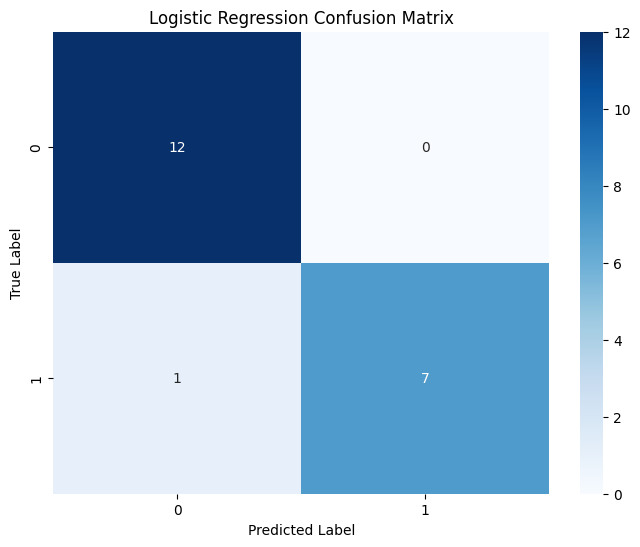

In [222]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import LeaveOneOut, cross_val_score


# Prepare data
# x = X_pca[:, :10]
x = StandardScaler().fit_transform(feb_mouse_diff_df[list(selected_features)])
y = feb_mouse_diff_df['irradiated']

# Initialize logistic regression model
log_reg = LogisticRegression(max_iter=1000, random_state=42)

# Perform Leave-One-Out cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)
loo_scores = cross_val_score(log_reg, x, y, cv=cv)
y_trues = []; y_preds = []
for train, test in cv.split(x):
    log_reg.fit(x[train], y[train])
    y_pred = log_reg.predict(x[test])
    y_trues.extend(y[test])
    y_preds.extend(y_pred)
# Print cross-validation results
print("Cross-Validation Scores:", loo_scores)
print("Average CV Score: {:.3f} (+/- {:.3f})".format(loo_scores.mean(), loo_scores.std() * 2))

# Print classification report
print("\nClassification Report:")
print(classification_report(y_trues, y_preds))

# Plot confusion matrix
cm = confusion_matrix(y_trues, y_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Logistic Regression Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

In [208]:
y_trues[0]

0     False
1      True
15     True
17     True
Name: irradiated, dtype: bool


Random Forest K-Fold Cross Validation Accuracy: 0.650


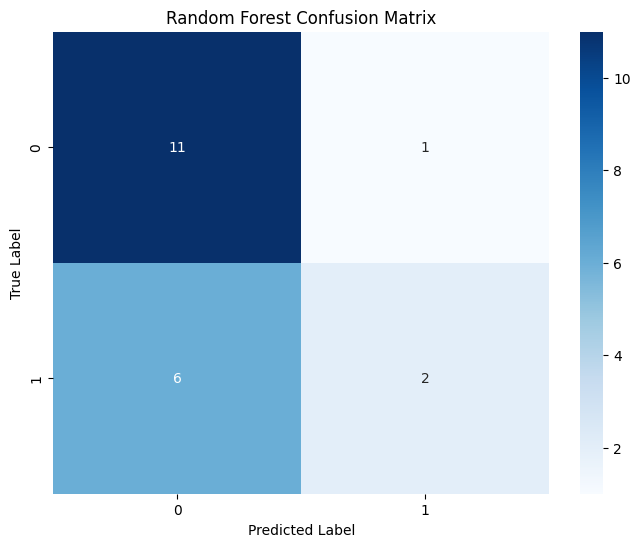


Random Forest Classification Report:
              precision    recall  f1-score   support

       False       0.65      0.92      0.76        12
        True       0.67      0.25      0.36         8

    accuracy                           0.65        20
   macro avg       0.66      0.58      0.56        20
weighted avg       0.65      0.65      0.60        20



In [211]:
# Train Random Forest model
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rf_kf_scores = []
rf_y_pred_all = []
rf_y_true_all = []

n_components = 10
# x = X_pca[:,:n_components]
# x = X_scaled
y = feb_mouse_diff_df['irradiated']

kf = KFold(n_splits=5, shuffle=True, random_state=71)
for train_idx, test_idx in kf.split(x, y):
    X_train, X_test = x[train_idx], x[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # Initialize and train Random Forest
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = rf_model.predict(X_test)
    
    rf_kf_scores.append(accuracy_score(y_test, y_pred))
    rf_y_pred_all.extend(list(y_pred))
    rf_y_true_all.extend(list(y_test))

# Calculate and print results
rf_cv_accuracy = np.mean(rf_kf_scores)
print(f"\nRandom Forest K-Fold Cross Validation Accuracy: {rf_cv_accuracy:.3f}")

# Create confusion matrix
rf_cm = confusion_matrix(rf_y_true_all, rf_y_pred_all)
plt.figure(figsize=(8, 6))
sns.heatmap(rf_cm, annot=True, fmt='d', cmap='Blues')
plt.title('Random Forest Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

print("\nRandom Forest Classification Report:")
print(classification_report(rf_y_true_all, rf_y_pred_all))



XGBoost K-Fold Cross Validation Accuracy: 0.700


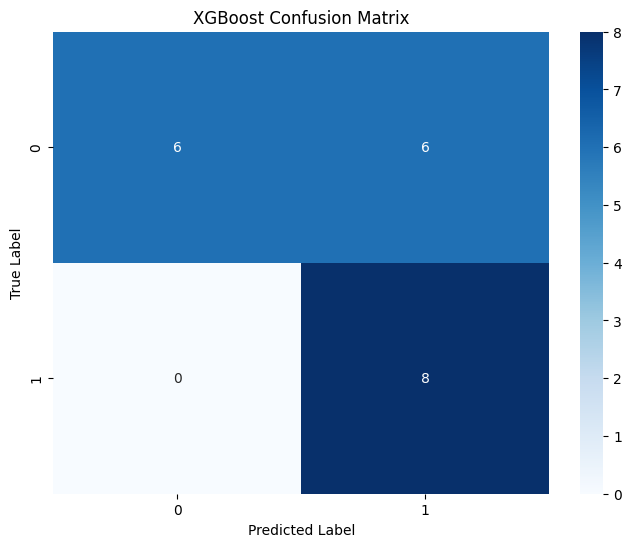


XGBoost Classification Report:
              precision    recall  f1-score   support

       False       1.00      0.50      0.67        12
        True       0.57      1.00      0.73         8

    accuracy                           0.70        20
   macro avg       0.79      0.75      0.70        20
weighted avg       0.83      0.70      0.69        20



In [212]:
# Train XGBoost model
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

xgb_kf_scores = []
xgb_y_pred_all = []
xgb_y_true_all = []

for train_idx, test_idx in kf.split(X_scaled, y):
    X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # Initialize and train XGBoost
    xgb_model = XGBClassifier(n_estimators=100, random_state=42)
    xgb_model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = 1-xgb_model.predict(X_test)
    
    xgb_kf_scores.append(accuracy_score(y_test, y_pred))
    xgb_y_pred_all.extend(list(y_pred))
    xgb_y_true_all.extend(list(y_test))

# Calculate and print results
xgb_cv_accuracy = np.mean(xgb_kf_scores)
print(f"\nXGBoost K-Fold Cross Validation Accuracy: {xgb_cv_accuracy:.3f}")

# Create confusion matrix
xgb_cm = confusion_matrix(xgb_y_true_all, xgb_y_pred_all)
plt.figure(figsize=(8, 6))
sns.heatmap(xgb_cm, annot=True, fmt='d', cmap='Blues')
plt.title('XGBoost Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

print("\nXGBoost Classification Report:")
print(classification_report(xgb_y_true_all, xgb_y_pred_all))
